In [9]:
import numpy as np
import torch
import torch.nn.functional as F
import torchvision
from datasets import load_dataset
from diffusers import DDPMScheduler, DDIMScheduler, DDPMPipeline
from matplotlib import pyplot as plt
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
import kornia as K

from torchmetrics import PeakSignalNoiseRatio
from torchmetrics import StructuralSimilarityIndexMeasure

device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)
device

height = 64
width = 64

batch_size = 1

# Generate Figure 5 (cherrypicked biased butterfly image dataset)

In [3]:
# Load butterfly image dataset
dataset_name = "huggan/smithsonian_butterflies_subset"
dataset = load_dataset(dataset_name, split="train")

print(dataset)
print(type(dataset))
print(dataset.info.description)
print(dataset.info.features)

Repo card metadata block was not found. Setting CardData to empty.
Generating train split: 100%|██████████| 1000/1000 [00:00<00:00, 2826.88 examples/s]

Dataset({
    features: ['image_url', 'image_alt', 'id', 'name', 'scientific_name', 'gender', 'taxonomy', 'region', 'locality', 'date', 'usnm_no', 'guid', 'edan_url', 'source', 'stage', 'image', 'image_hash', 'sim_score'],
    num_rows: 1000
})
<class 'datasets.arrow_dataset.Dataset'>

{'image_url': Value(dtype='string', id=None), 'image_alt': Value(dtype='string', id=None), 'id': Value(dtype='string', id=None), 'name': Value(dtype='string', id=None), 'scientific_name': Value(dtype='string', id=None), 'gender': Value(dtype='string', id=None), 'taxonomy': Value(dtype='string', id=None), 'region': Value(dtype='string', id=None), 'locality': Value(dtype='string', id=None), 'date': Value(dtype='string', id=None), 'usnm_no': Value(dtype='string', id=None), 'guid': Value(dtype='string', id=None), 'edan_url': Value(dtype='string', id=None), 'source': Value(dtype='string', id=None), 'stage': Value(dtype='float64', id=None), 'image': Image(mode=None, decode=True, id=None), 'image_hash': Value(d

/tmp/ipykernel_29029/2570525567.py:7: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


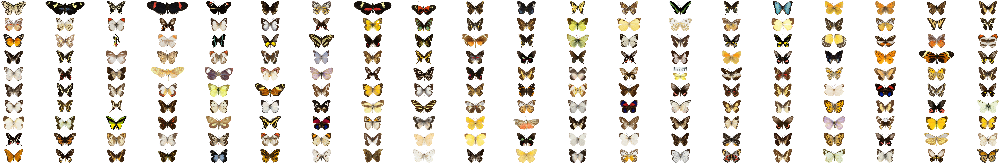

In [4]:
# Plot the first 200 butterflies in the dataset (so we can select our desired subset)
fig, axs = plt.subplots(10, 20, figsize=(100, 16))
axs = axs.flatten()
for i, image in enumerate(dataset[:200]["image"]):
# for i, image in enumerate(dataset[:4]["img"]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

In [10]:
# Transform to 64x64 pixel images to match diffusion model outputs
preprocess = transforms.Compose(
    [
        transforms.Resize((height, width)),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    # images = [preprocess(image.convert("RGB")) for image in examples["img"]]
    return {"images": images}

dataset.set_transform(transform)

/tmp/ipykernel_29029/2281759891.py:6: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


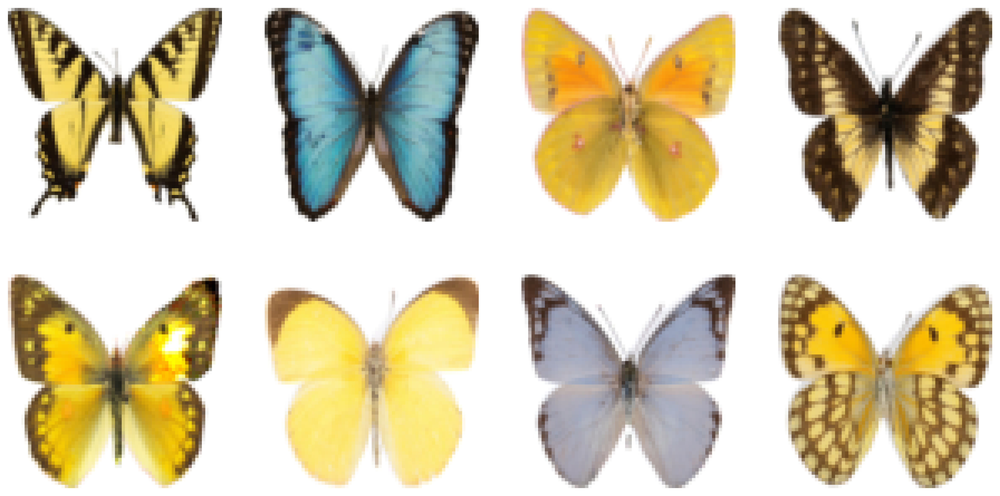

In [11]:
# Display desired images
fig, axs = plt.subplots(2, 4, figsize=(16, 8), dpi=600)
axs = axs.flatten()
for i, image in enumerate(dataset[11, 15, 16, 19, 27, 169, 66, 98]["images"]):
    axs[i].imshow(image.permute(1, 2, 0).numpy() / 2 + 0.5)
    axs[i].set_axis_off()
fig.show()
# fig.savefig("test_output.svg")

# Generate Figure 2 (color-guided butterflies)
Code adapted from [Hugging Face diffusion models course unit 2](https://github.com/huggingface/diffusion-models-class/blob/main/unit2/01_finetuning_and_guidance.ipynb)

The code below uses my [pretrained ddpm](./ddpm-butterflies-64/). An equivalent model can be trained with code from [Hugging Face diffusion models course unit 1](https://github.com/huggingface/diffusion-models-class/blob/main/unit1/01_introduction_to_diffusers.ipynb)

In [13]:
def imshow(input: torch.Tensor):
    out = torchvision.utils.make_grid(input, nrow=4, padding=10, pad_value=1)
    out_np: np.ndarray = K.utils.tensor_to_image(out)
    plt.imshow(out_np)
    plt.axis('off')
    plt.show()

In [16]:
# Load the pretrained pipeline
pipeline_name = 'ddpm-butterflies-64'
image_pipe = DDPMPipeline.from_pretrained(pipeline_name).to(device)

# scheduler = DDIMScheduler.from_pretrained(pipeline_name)
# scheduler = DDIMScheduler(num_train_timesteps=1000)
# scheduler.set_timesteps(num_inference_steps=40)
# scheduler.timesteps
scheduler = DDPMScheduler(num_train_timesteps=1000)

Loading pipeline components...: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


In [38]:
def color_loss(images, target_color=(0.1, 0.9, 0.5), loss='mad'):
    """Given a target color (R, G, B) return a loss for how far away on average
    the images' pixels are from that color. Defaults to a light teal: (0.1, 0.9, 0.5)"""
    target = (
        torch.tensor(target_color).to(images.device) * 2 - 1
    )  # Map target color to (-1, 1)
    target = target[
        None, :, None, None
    ]  # Get shape right to work with the images (b, c, h, w)
    target = target.expand(1, 3, 64, 64)

    if loss=='mse':
        error = F.mse_loss(images, target)
    elif loss=='psnr':
        psnr = PeakSignalNoiseRatio().to(device)
        error = psnr(images, target)
    else:
        error = torch.abs(
            images - target
        ).mean()  # Mean absolute difference between the image pixels and the target color
    return error

0it [00:00, ?it/s]

0 loss: 0.525638222694397


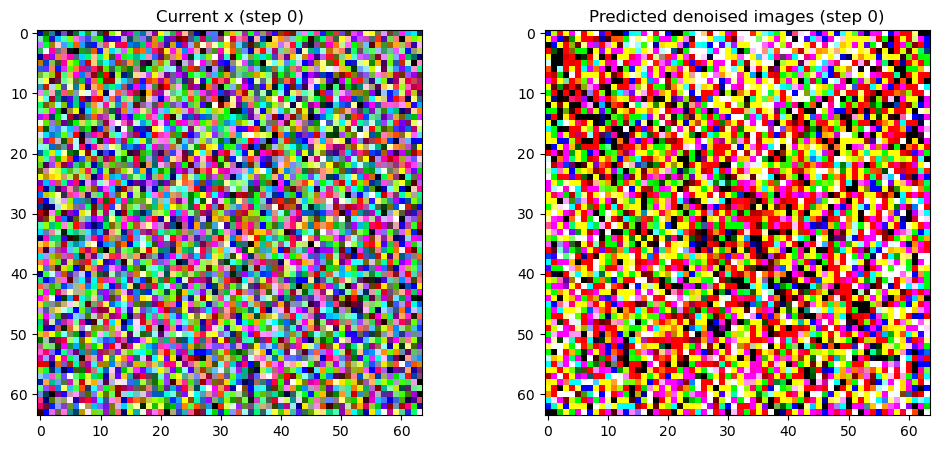

104it [00:05, 22.24it/s]

100 loss: 0.30010268092155457


203it [00:09, 22.18it/s]

200 loss: 0.16298335790634155


248it [00:11, 22.07it/s]

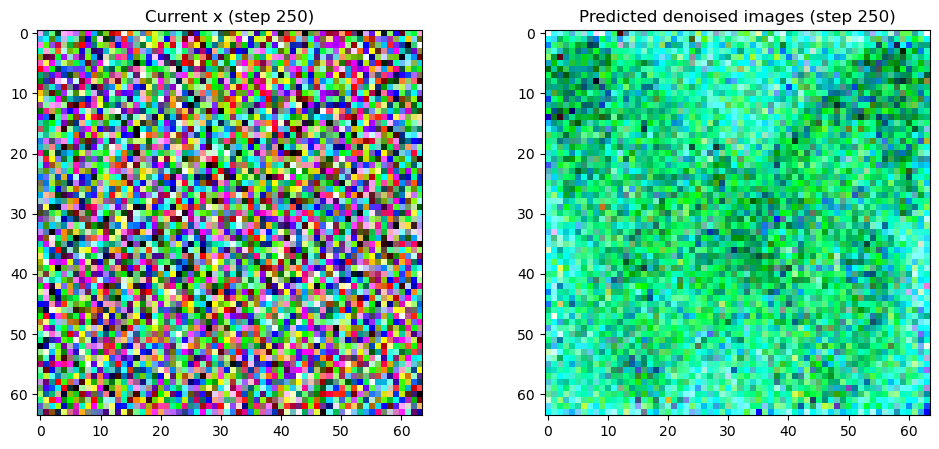

302it [00:14, 21.87it/s]

300 loss: 0.1348065584897995


404it [00:18, 22.53it/s]

400 loss: 0.16815626621246338


500it [00:23, 22.12it/s]

500 loss: 0.22386226058006287


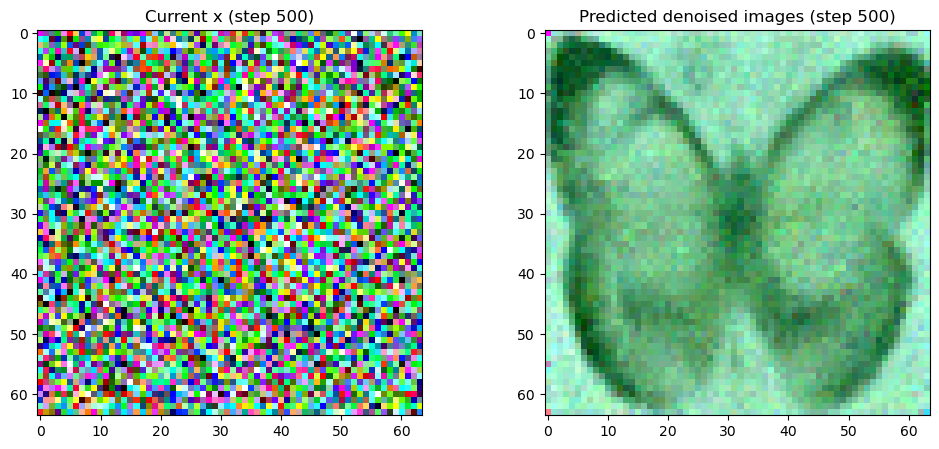

605it [00:28, 22.16it/s]

600 loss: 0.27907878160476685


704it [00:32, 21.48it/s]

700 loss: 0.3078727126121521


749it [00:34, 18.57it/s]

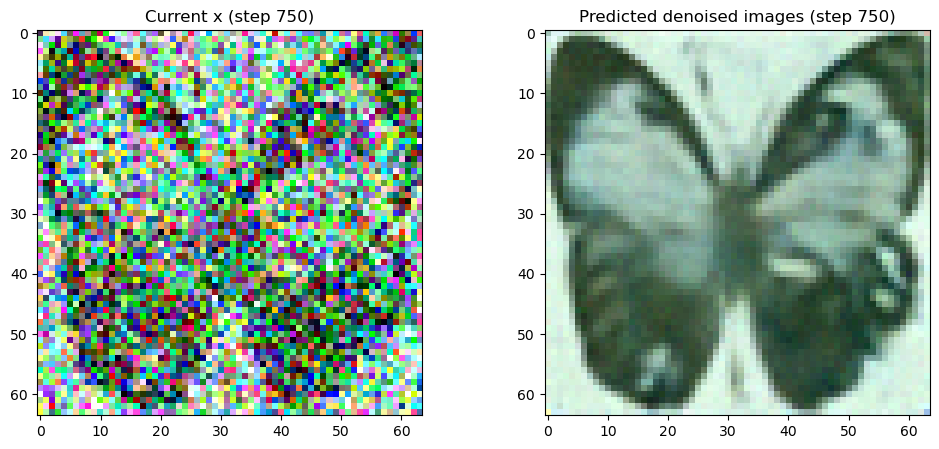

805it [00:37, 22.61it/s]

800 loss: 0.3250875473022461


904it [00:41, 22.08it/s]

900 loss: 0.33649349212646484


997it [00:46, 21.54it/s]

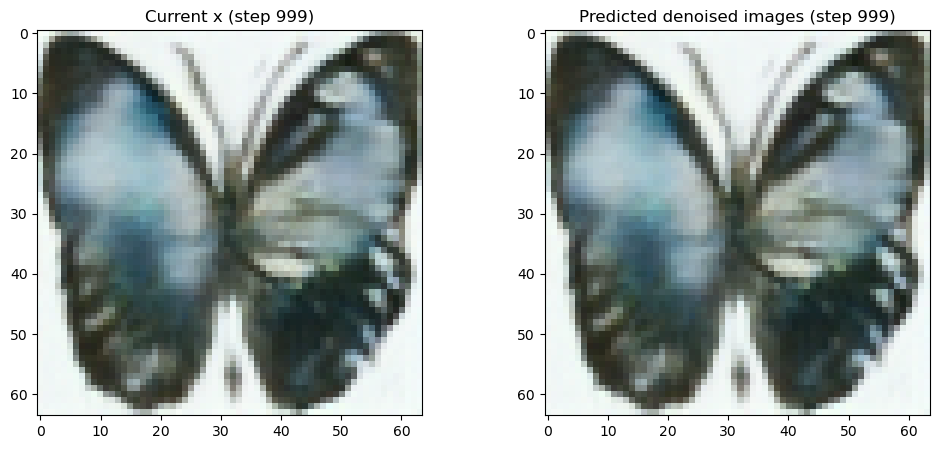

1000it [00:46, 21.48it/s]


In [27]:
# Variant 2: setting x.requires_grad before calculating the model predictions
guidance_loss_scale = 0.5

torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)
# x = x[3]
for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate loss
    loss = color_loss(x0) * guidance_loss_scale
    if i % 100 == 0:
        print(i, "loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # # Modify x based on this gradient with a scheduler
    # alpha_bar = scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + cond_grad * ((1 - alpha_bar).sqrt())
    # )  # Note the addition al scaling factor here!

    # Modify x based on this gradient
    x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

# grid = torchvision.utils.make_grid(x, nrow=4)
# im = grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5
# Image.fromarray(np.array(im * 255).astype(np.uint8))

# plt.savefig("guided_butterfly.svg")

# Generate Figure 3 (Guidance Scaling Schedules)
Taken from Hugging Face diffusion models course unit 2

Text(0, 0.5, 'Step size')

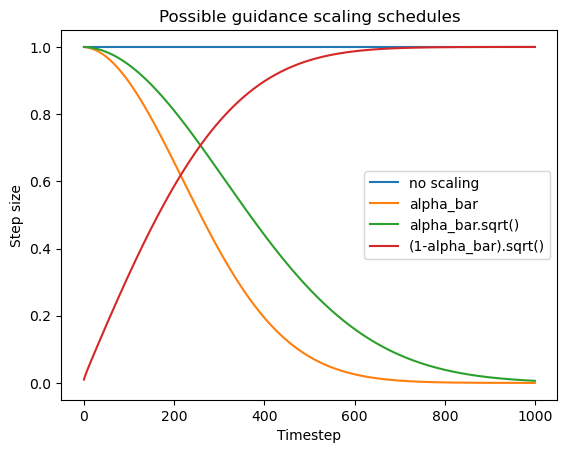

In [ ]:
plt.plot([1 for a in scheduler.alphas_cumprod], label="no scaling")
plt.plot([a for a in scheduler.alphas_cumprod], label="alpha_bar")
plt.plot([a.sqrt() for a in scheduler.alphas_cumprod], label="alpha_bar.sqrt()")
plt.plot(
    [(1 - a).sqrt() for a in scheduler.alphas_cumprod], label="(1-alpha_bar).sqrt()"
)
plt.legend()
plt.title("Possible guidance scaling schedules")

plt.xlabel('Timestep')
plt.ylabel('Step size')
# plt.savefig("guidance_scaling_schedule.pdf")

# Generate Figure 6 Equivalent (Unconditional Butterfly Generation)

1000it [00:26, 37.08it/s]


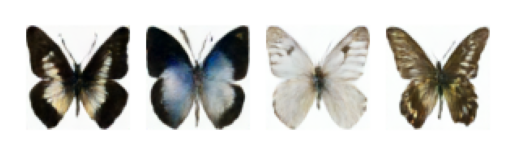

In [29]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(0)
x = torch.randn(4, 3, 64, 64).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

imshow(x.clip(-1, 1) * 0.5 + 0.5)

# Generate Figure 4 Equivalent (Canny Edge Detection)

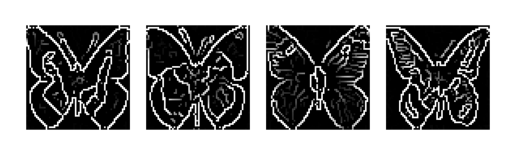

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


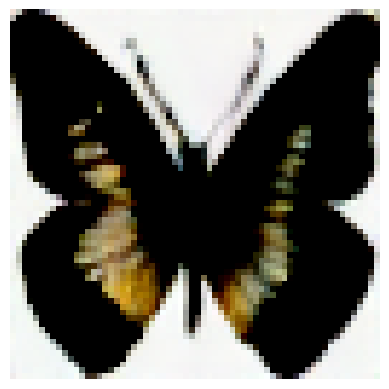

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


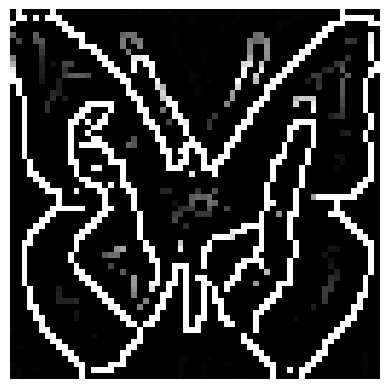

In [30]:
x_gray = K.color.rgb_to_grayscale(x)

x_laplacian: torch.Tensor = K.filters.canny(x_gray)[0].to(device)
imshow(x_laplacian.clamp(0., 1.))
torch.squeeze(x_laplacian.clamp(0., 1.))

starter_edges = x_laplacian[0, 0, :, :width]#.repeat(1, 4)
# print(starter_edges.shape)
imshow(x[0, :, :, :width]) # show first image
imshow(starter_edges) # show first image's edges

In [53]:
def get_edges(images):
    images_rgb = images * 0.5 + 0.5 # rescale from -1, 1 to 0, 1
    images_gray = K.color.rgb_to_grayscale(images_rgb) # get gray image
    images_laplacian: torch.Tensor = K.filters.canny(images_gray)[0] # canny filter for edge detection
    return images_laplacian

# Target edge is based on first image in batch of 4
def edge_loss(images, target_edges=starter_edges):
    """Given an edge matrix (R, G, B) return a loss for how far away on average
    the images' edges are from that matrix. Defaults to a first generated image"""
    target_edges = target_edges.reshape((height, width, batch_size))
    target_edges = target_edges.permute(2, 0, 1)
    target_edges = target_edges[
        :, None, :, :
    ]  # Get shape right to work with the images (b, c, h, w)

    images_edges = get_edges(images)

    ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    error = 1 - ssim(images_edges, target_edges)
    
    # psnr = PeakSignalNoiseRatio().to(device)
    # error = 1 - psnr(images_edges, target_edges)

    # error = F.mse_loss(images_edges, target_edges)

    return error

# Generate Figure 7 (Initial color guidance results)

3it [00:00,  6.87it/s]

0 loss: 0.4713214337825775


103it [00:09, 11.98it/s]

100 loss: 0.33544987440109253


203it [00:17, 11.99it/s]

200 loss: 0.25505825877189636


303it [00:25, 12.00it/s]

300 loss: 0.24631015956401825


403it [00:34, 12.01it/s]

400 loss: 0.29648369550704956


503it [00:42, 11.89it/s]

500 loss: 0.32544636726379395


603it [00:50, 11.95it/s]

600 loss: 0.344122976064682


703it [00:59, 11.89it/s]

700 loss: 0.3589423596858978


803it [01:07, 11.27it/s]

800 loss: 0.3670247197151184


904it [01:13, 20.13it/s]

900 loss: 0.3730563819408417


1000it [01:18, 12.76it/s]


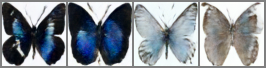

In [37]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(0)
x = torch.randn(4, 3, 64, 64).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate loss
    loss = color_loss(x0) * 0.5
    if i % 100 == 0:
        print(i, "loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # Modify x based on this gradient
    x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

grid = torchvision.utils.make_grid(x, nrow=4)
im = grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5
Image.fromarray(np.array(im * 255).astype(np.uint8))

# plt.savefig("guided_butterfly.svg")

# Generate individual components for Figures 8-10

### Starting Unconditional Butterfly

0it [00:00, ?it/s]

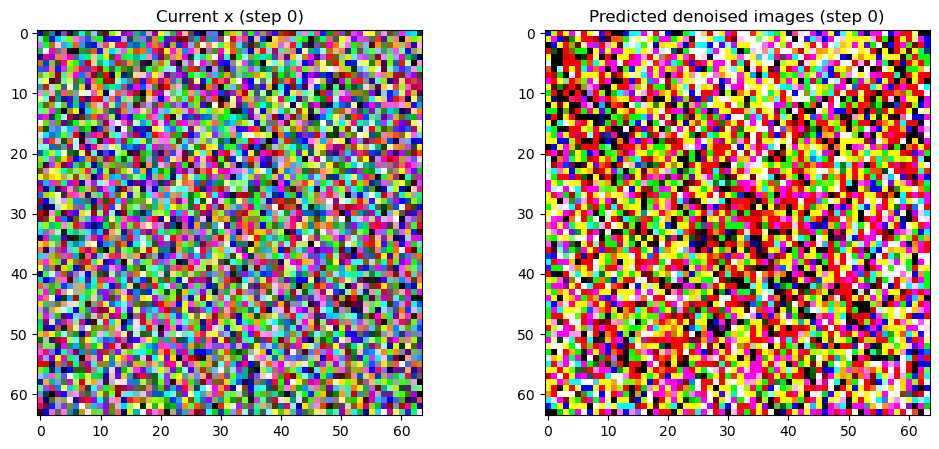

247it [00:06, 43.92it/s]

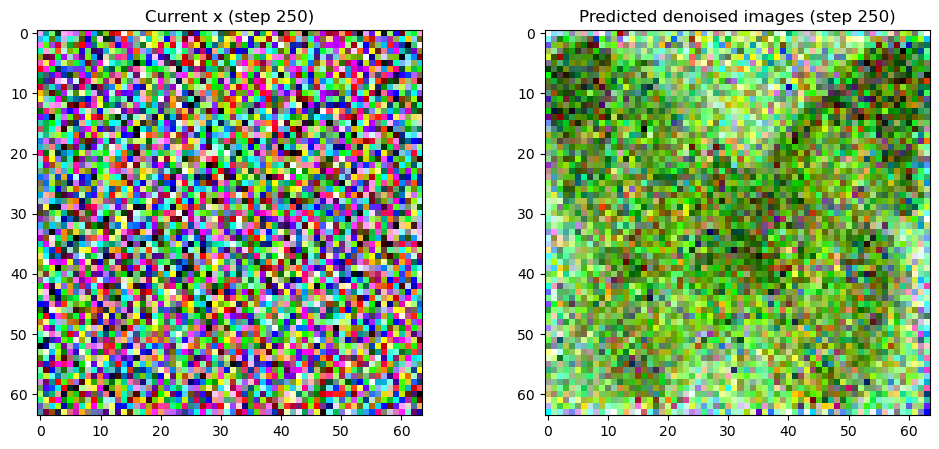

497it [00:11, 45.12it/s]

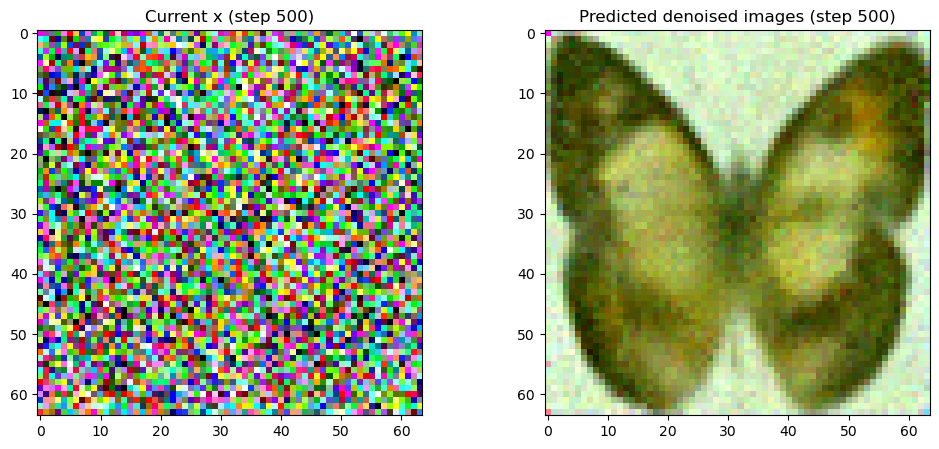

747it [00:17, 43.48it/s]

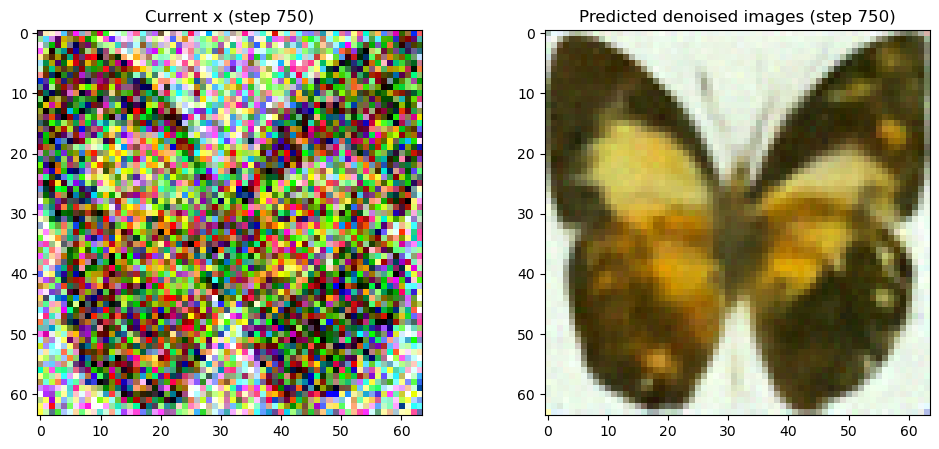

997it [00:23, 44.30it/s]

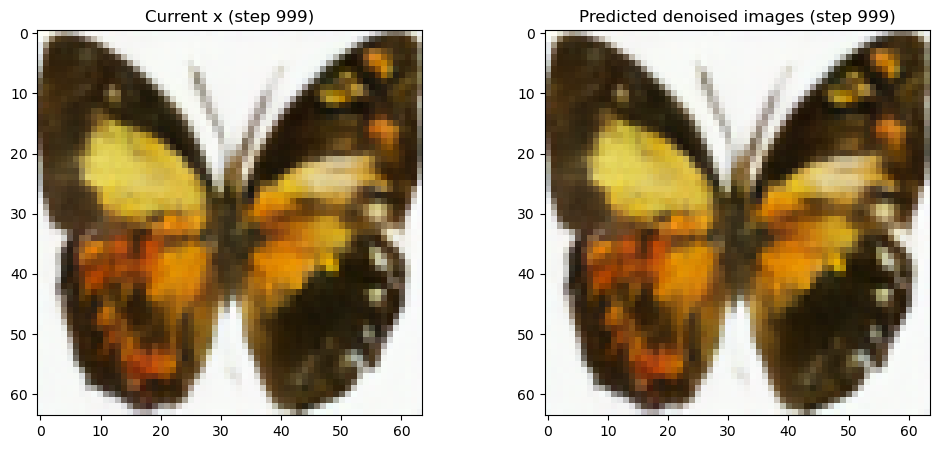

1000it [00:23, 41.83it/s]


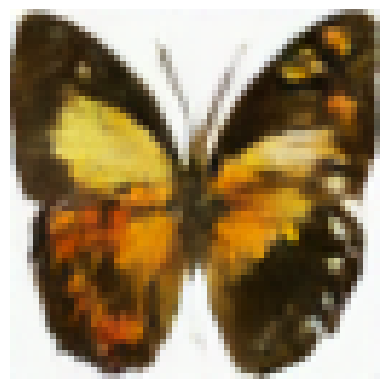

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


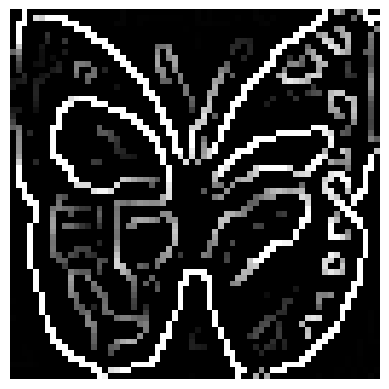

In [44]:
# Random starting point (batch of 8 images)
torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)

# Minimal sampling loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

imshow(x.clip(-1, 1) * 0.5 + 0.5)

target_edges = get_edges(x)
imshow(target_edges)

### Base Color Guidance (MSE loss function)

0it [00:00, ?it/s]

0 feature loss: 1.5082621574401855


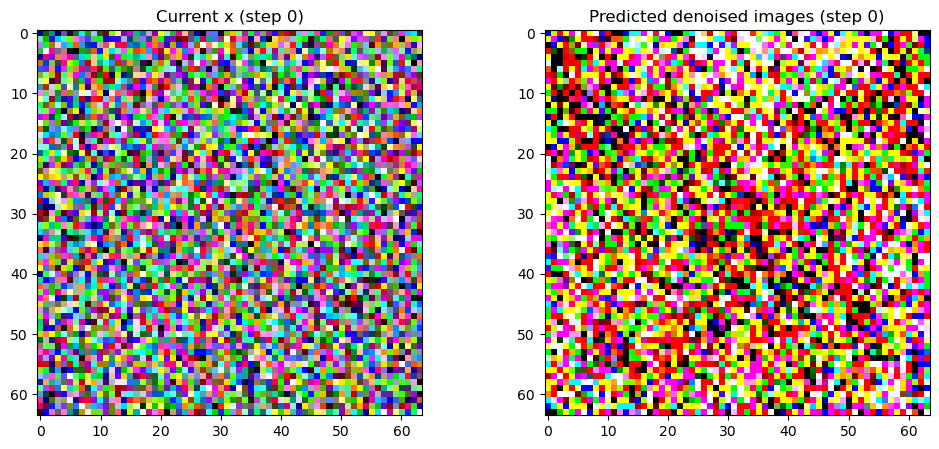

103it [00:04, 22.21it/s]

100 feature loss: 0.34312158823013306


205it [00:09, 22.14it/s]

200 feature loss: 0.16424532234668732


250it [00:11, 22.15it/s]

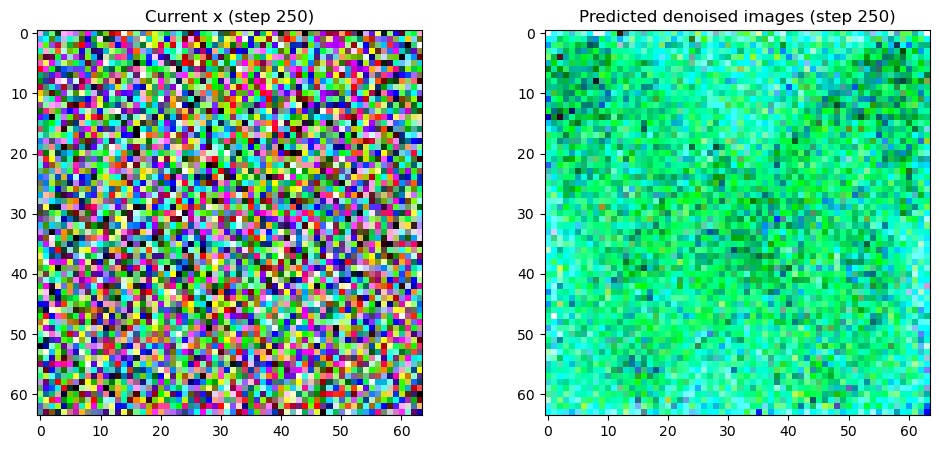

304it [00:14, 22.92it/s]

300 feature loss: 0.09118723124265671


403it [00:18, 23.06it/s]

400 feature loss: 0.1294601559638977


499it [00:22, 23.02it/s]

500 feature loss: 0.214228555560112


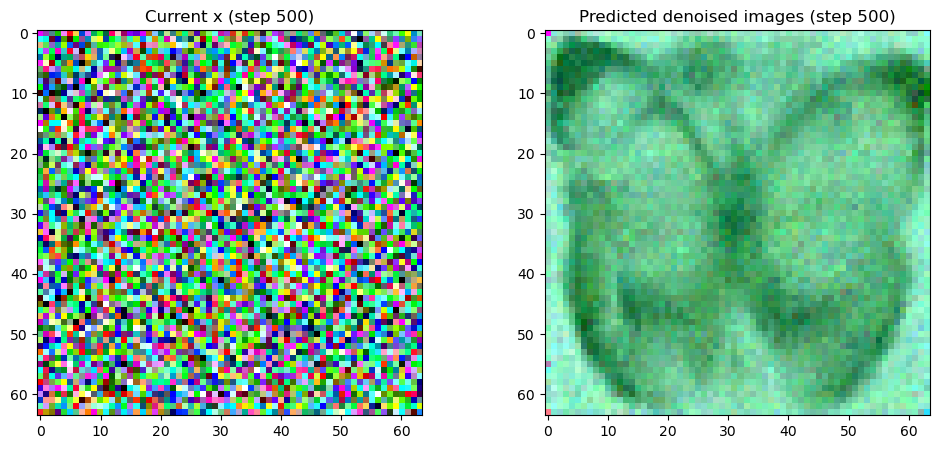

604it [00:27, 22.91it/s]

600 feature loss: 0.34657883644104004


703it [00:31, 22.92it/s]

700 feature loss: 0.43782398104667664


748it [00:33, 22.84it/s]

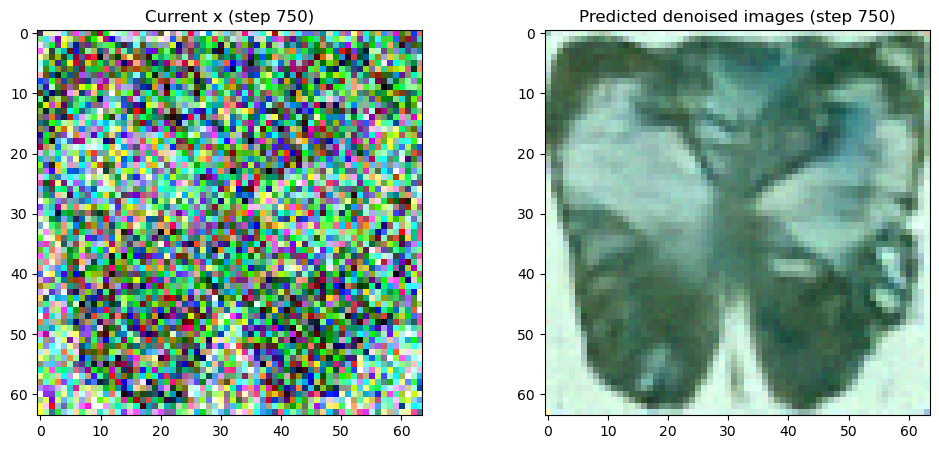

805it [00:36, 21.95it/s]

800 feature loss: 0.49272191524505615


904it [00:41, 21.98it/s]

900 feature loss: 0.5289286971092224


997it [00:45, 21.66it/s]

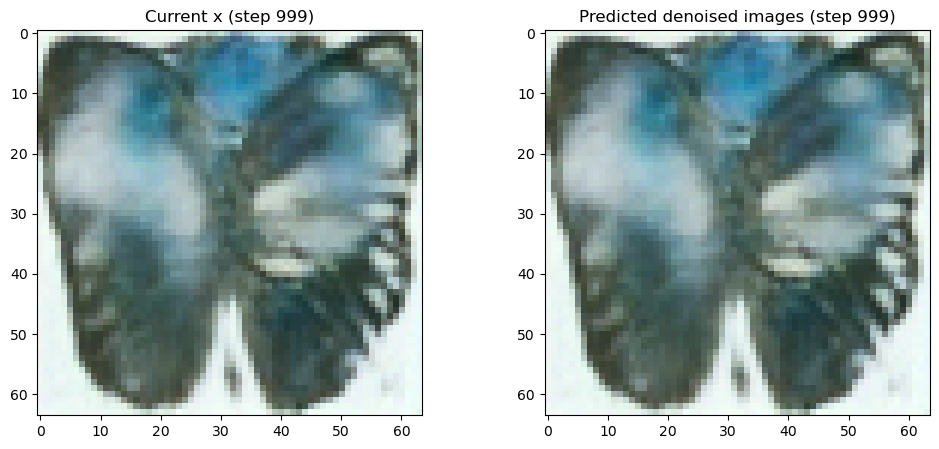

1000it [00:45, 21.81it/s]


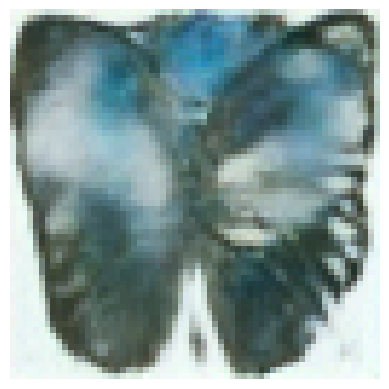

In [40]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate feature loss
    loss = color_loss(x0, loss='mse')
    if i % 100 == 0:
        print(i, "feature loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # # Modify x based on this gradient
    # alpha_bar = scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + cond_grad * (alpha_bar)
    # )  # Note the additional scaling factor here!

    # Modify x based on this gradient
    x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

y2 = x.clip(-1, 1) * 0.5 + 0.5
imshow(y2)

### Constraint Weighting (mse half weighted)

0it [00:00, ?it/s]

0 feature loss: 1.5082621574401855


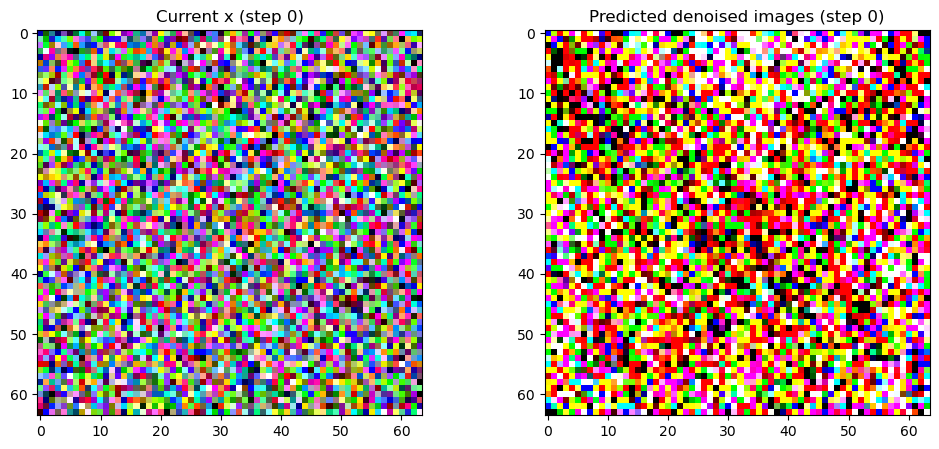

103it [00:05, 21.97it/s]

100 feature loss: 0.441645085811615


202it [00:09, 21.18it/s]

200 feature loss: 0.17405405640602112


250it [00:11, 21.72it/s]

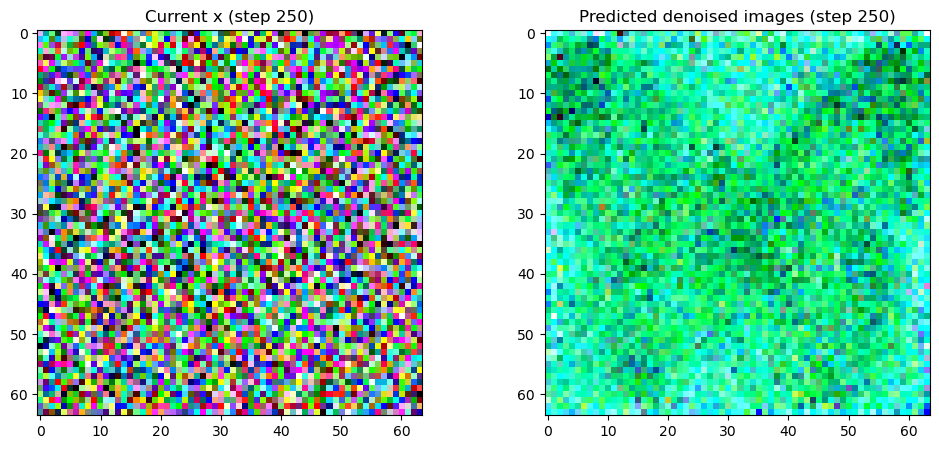

304it [00:14, 22.44it/s]

300 feature loss: 0.11360174417495728


403it [00:18, 21.69it/s]

400 feature loss: 0.17276668548583984


499it [00:23, 22.07it/s]

500 feature loss: 0.28539329767227173


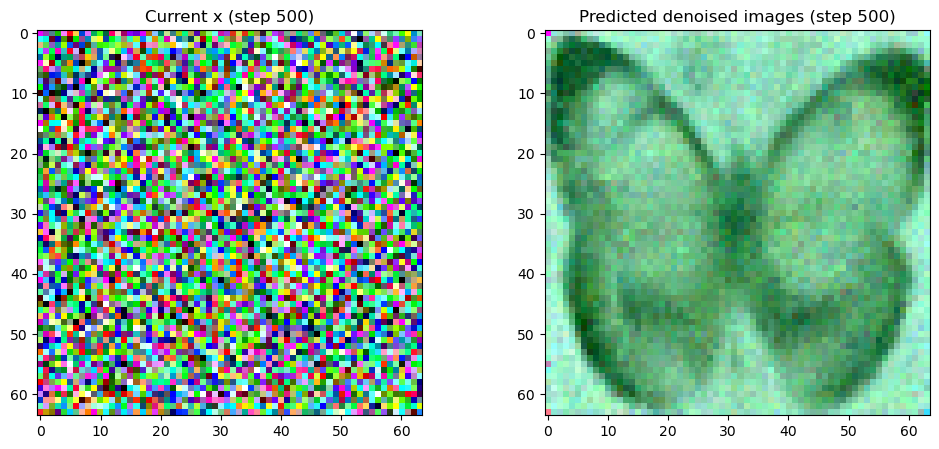

604it [00:28, 21.57it/s]

600 feature loss: 0.4369809627532959


703it [00:32, 22.10it/s]

700 feature loss: 0.5360095500946045


748it [00:34, 22.10it/s]

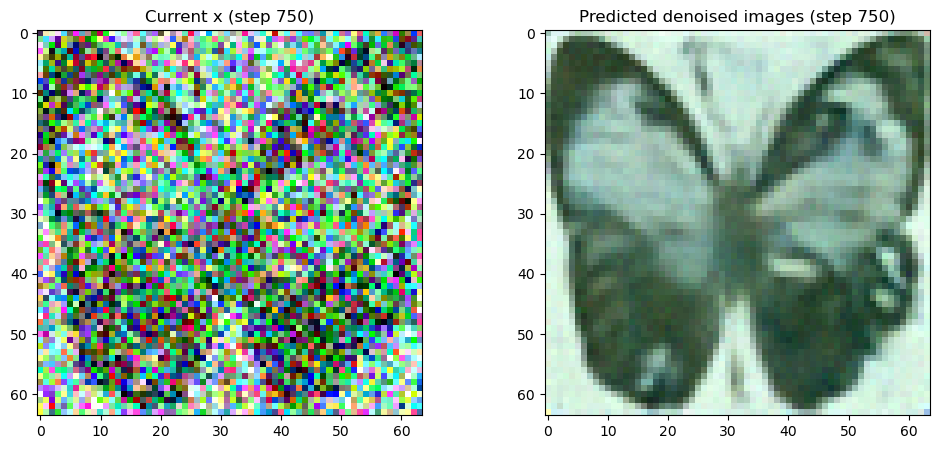

805it [00:37, 22.05it/s]

800 feature loss: 0.5977576971054077


904it [00:42, 22.22it/s]

900 feature loss: 0.6433976888656616


997it [00:46, 22.46it/s]

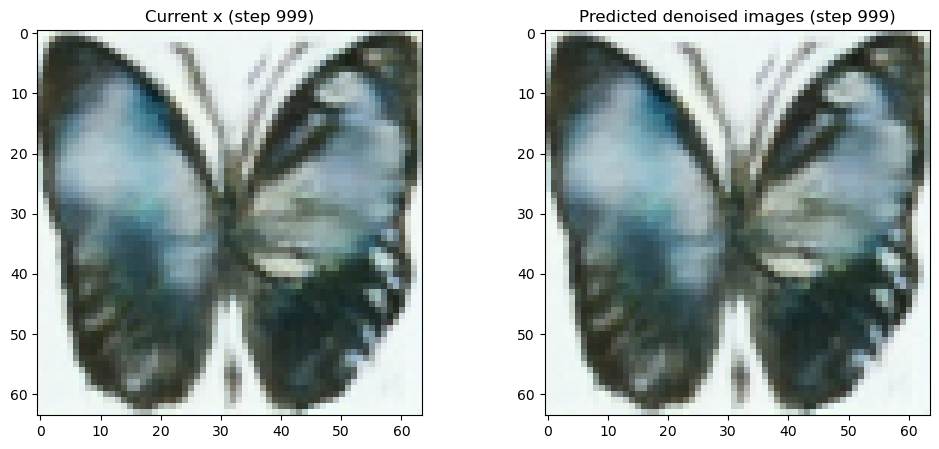

1000it [00:46, 21.48it/s]


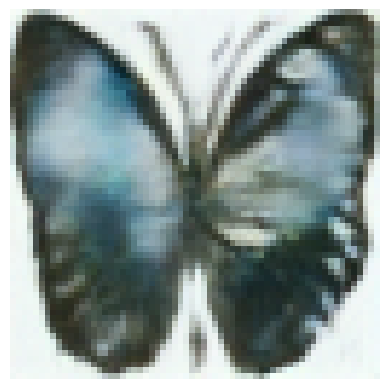

In [42]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate feature loss
    loss = color_loss(x0, loss='mse')
    if i % 100 == 0:
        print(i, "feature loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # # Modify x based on this gradient
    # alpha_bar = scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + cond_grad * (alpha_bar)
    # )  # Note the additional scaling factor here!

    # Modify x based on this gradient
    x = x.detach() + cond_grad * 0.5

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

y2 = x.clip(-1, 1) * 0.5 + 0.5
imshow(y2)

### Guidance Scaling (alpha_bar)

0it [00:00, ?it/s]

0 feature loss: 1.5082621574401855


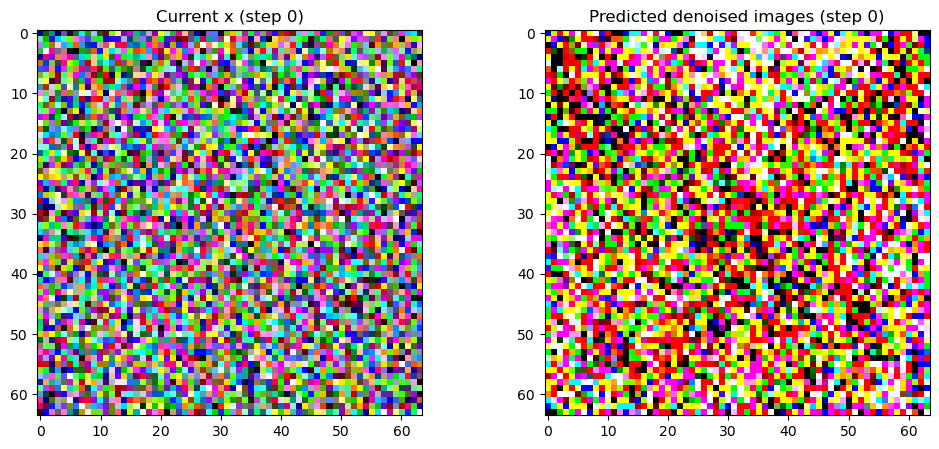

103it [00:04, 25.69it/s]

100 feature loss: 0.349667489528656


205it [00:08, 26.39it/s]

200 feature loss: 0.16799116134643555


250it [00:10, 26.08it/s]

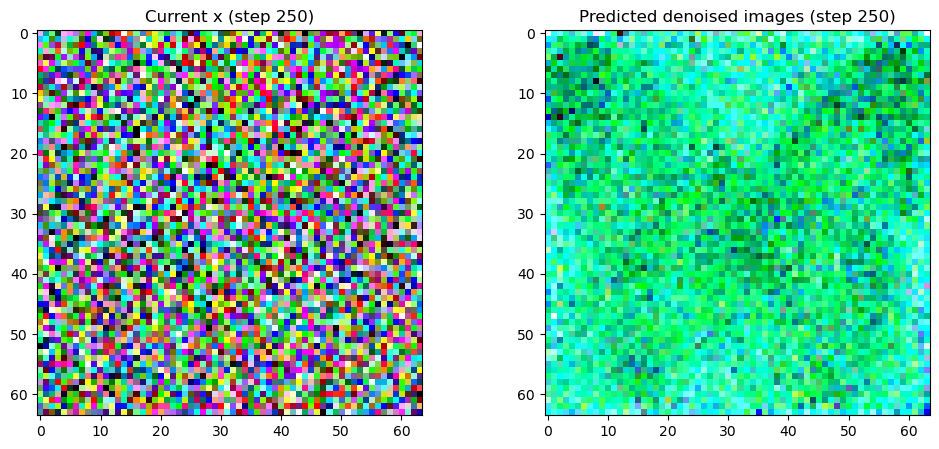

304it [00:12, 25.98it/s]

300 feature loss: 0.10787159204483032


403it [00:16, 25.11it/s]

400 feature loss: 0.184583842754364


499it [00:19, 26.15it/s]

500 feature loss: 0.33514100313186646


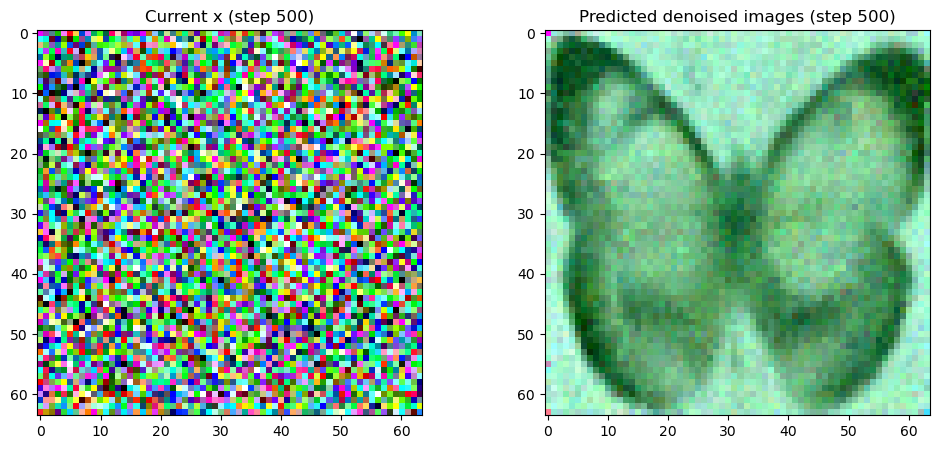

604it [00:24, 26.13it/s]

600 feature loss: 0.5086860656738281


703it [00:27, 25.82it/s]

700 feature loss: 0.6090993881225586


748it [00:29, 25.70it/s]

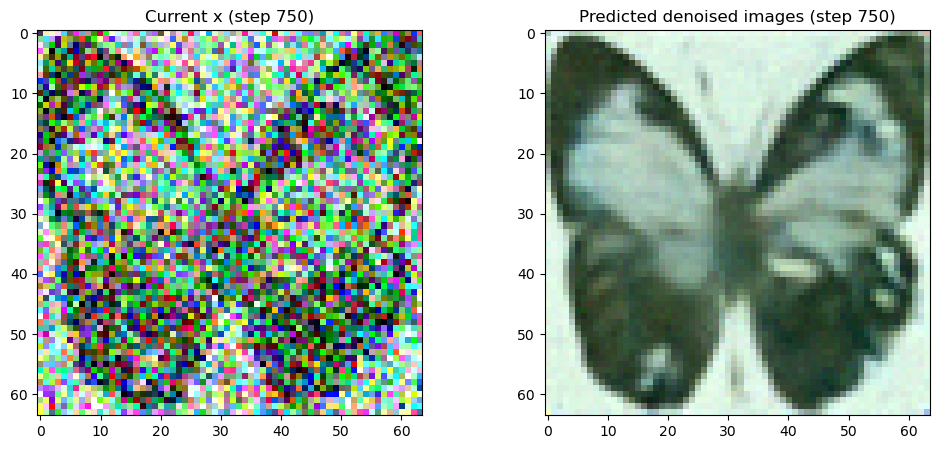

805it [00:32, 26.05it/s]

800 feature loss: 0.6748358607292175


904it [00:35, 26.32it/s]

900 feature loss: 0.7248659133911133


997it [00:39, 26.42it/s]

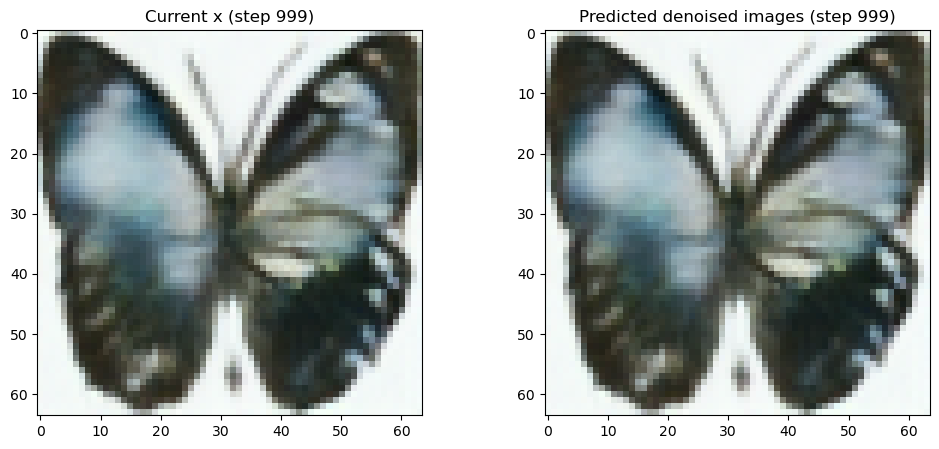

1000it [00:39, 25.14it/s]


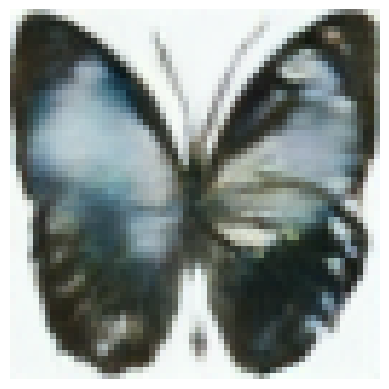

In [39]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate feature loss
    loss = color_loss(x0, loss='mse')
    if i % 100 == 0:
        print(i, "feature loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # Modify x based on this gradient
    alpha_bar = scheduler.alphas_cumprod[i]
    x = (
        x.detach() + cond_grad * (alpha_bar)
    )  # Note the additional scaling factor here!

    # # Modify x based on this gradient
    # x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

y2 = x.clip(-1, 1) * 0.5 + 0.5
imshow(y2)

### Edge Loss Term (MSE loss + 10*SSIM edges)
Had to weight the edge loss term (10x) to better match results from report

0it [00:00, ?it/s]/root/anaconda3/envs/expanded_diff_lin/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


0 feature loss: 11.471885681152344


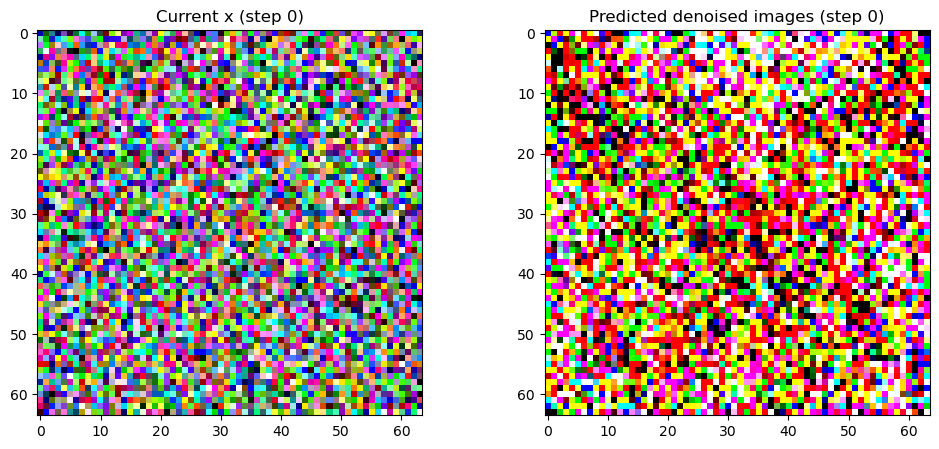

103it [00:06, 18.10it/s]

100 feature loss: 9.80939769744873


203it [00:11, 19.47it/s]

200 feature loss: 9.682090759277344


249it [00:13, 19.32it/s]

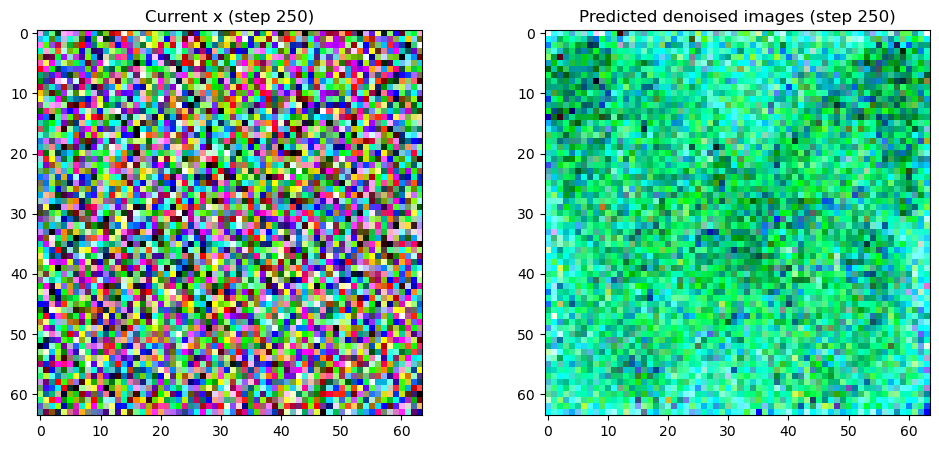

304it [00:16, 19.55it/s]

300 feature loss: 9.211585998535156


403it [00:21, 19.14it/s]

400 feature loss: 8.49739933013916


499it [00:26, 20.99it/s]

500 feature loss: 7.717324733734131


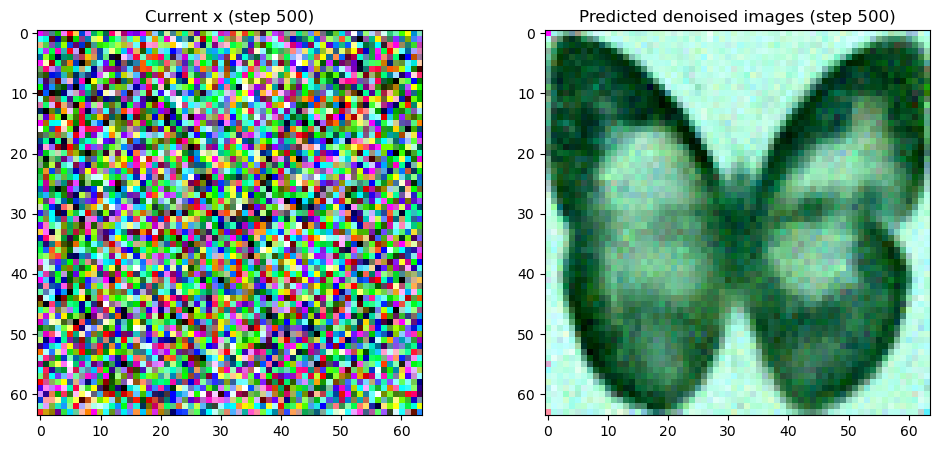

603it [00:32, 20.05it/s]

600 feature loss: 6.815547943115234


703it [00:37, 19.85it/s]

700 feature loss: 5.637474060058594


748it [00:39, 20.12it/s]

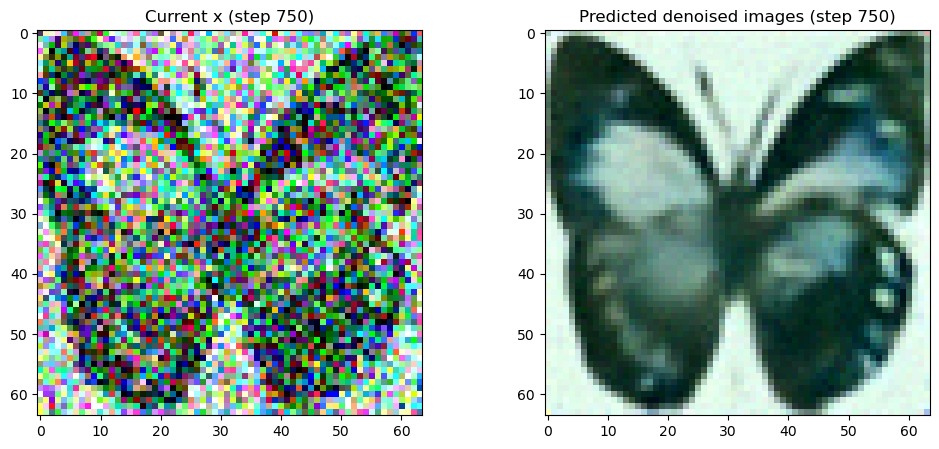

803it [00:42, 20.36it/s]

800 feature loss: 4.315694332122803


902it [00:47, 20.13it/s]

900 feature loss: 3.285511016845703


997it [00:52, 19.66it/s]

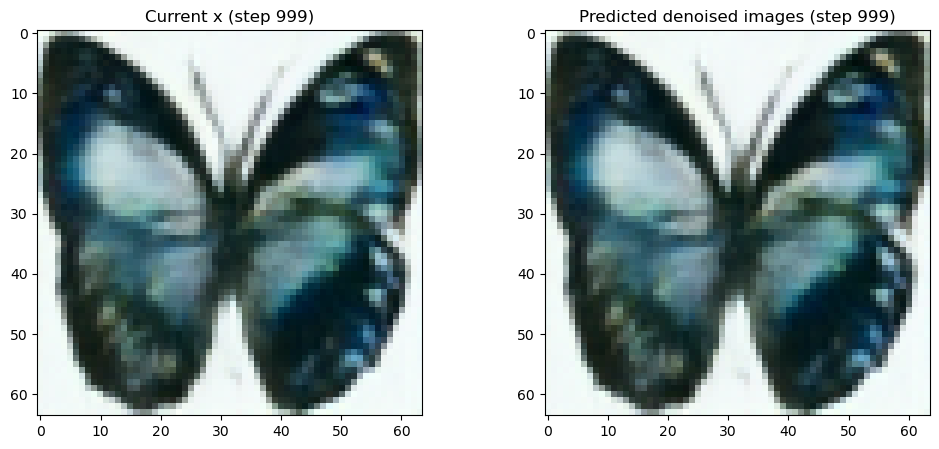

1000it [00:52, 19.09it/s]


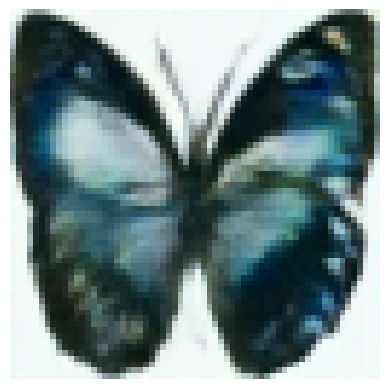

In [55]:
# Variant 2: setting x.requires_grad before calculating the model predictions
torch.manual_seed(1)
x = torch.randn(1, 3, height, width).to(device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = image_pipe.unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate feature loss
    loss = color_loss(x0, loss='mse') + 10*edge_loss(x0, target_edges)
    if i % 100 == 0:
        print(i, "feature loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # # Modify x based on this gradient
    # alpha_bar = scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + cond_grad * (alpha_bar.sqrt())
    # )  # Note the additional scaling factor here!

    # # Modify x based on this gradient
    x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            test_x = x
            grid = torchvision.utils.make_grid(test_x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

y4 = x.clip(-1, 1) * 0.5 + 0.5
imshow(y4)